In [1]:
import pandas as pd, numpy as np
import matplotlib.pyplot as plt ,seaborn as sns

In [2]:
df  = pd.read_csv(r"C:\Users\hp\Downloads\mnist.csv")

In [3]:
df

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59996,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59997,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59998,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.shape

(60000, 785)

In [6]:
df.loc[1991]

label    5
1x1      0
1x2      0
1x3      0
1x4      0
        ..
28x24    0
28x25    0
28x26    0
28x27    0
28x28    0
Name: 1991, Length: 785, dtype: int64

In [7]:
x= df.iloc[:,1:]
y=df.iloc[:,0]

In [8]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test =train_test_split(x,y,test_size=0.2,random_state=2)

In [9]:
X_test.shape

(12000, 784)

In [10]:
X_train.shape

(48000, 784)

In [11]:
from sklearn.neighbors import KNeighborsClassifier

In [12]:
knn=KNeighborsClassifier()

In [23]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [25]:
import time
start = time.time()
y_pred=knn.predict(X_test)
print(time.time() - start)

17.93226456642151


In [26]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9719166666666667

In [27]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()

In [28]:
X_train=scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

In [29]:
#PCA
from sklearn.decomposition import PCA
pca = PCA(n_components = 200)


In [30]:
X_train_trf =pca.fit_transform(X_train)
X_test_trf = pca.fit_transform(X_test)

In [31]:
knn =KNeighborsClassifier()

In [39]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [41]:
y_pred = knn.predict(X_test_trf)

In [42]:
accuracy_score(y_test,y_pred)


0.39716666666666667

In [ ]:
for i in range(1,785):
    pca=PCA(n_components=i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)
    knn = KNeighborsClassifier()
    knn.fit(X_train_trf,y_train)
    y_pred = knn.predict(X_test_trf)
    print(accuracy_score(y_test,y_pred))

0.25533333333333336
0.3154166666666667
0.5053333333333333
0.6651666666666667
0.7416666666666667
0.8321666666666667
0.8418333333333333
0.8775
0.8920833333333333
0.9130833333333334
0.922
0.9255
0.9345
0.93775
0.9408333333333333
0.9413333333333334
0.9430833333333334
0.94625
0.9478333333333333
0.9500833333333333
0.9501666666666667
0.9494166666666667
0.9513333333333334
0.9515833333333333
0.9529166666666666
0.9535833333333333
0.9555
0.9545833333333333
0.955
0.95625
0.956
0.9575
0.9575833333333333
0.957
0.95775
0.9590833333333333
0.9595833333333333
0.96025
0.9606666666666667
0.9605833333333333
0.961
0.96025
0.95975
0.9591666666666666
0.9588333333333333
0.9605
0.9591666666666666
0.9599166666666666
0.9595
0.9596666666666667
0.95875
0.959
0.959
0.9589166666666666
0.9588333333333333
0.9585
0.9593333333333334
0.95925
0.959
0.9595833333333333
0.95975
0.95975
0.9595833333333333
0.9601666666666666
0.9589166666666666
0.959
0.9593333333333334
0.9605833333333333
0.9595
0.9596666666666667
0.9595
0.96
0.9

In [45]:
pca = PCA(n_components= 2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [47]:
X_train_trf

array([[-2.89635697,  0.53686539],
       [ 5.07634445,  7.34072182],
       [-2.42414219, -1.0553333 ],
       ...,
       [ 0.40081245, -5.53845882],
       [11.70249376, -7.3185063 ],
       [ 2.65016688,  1.27874586]])

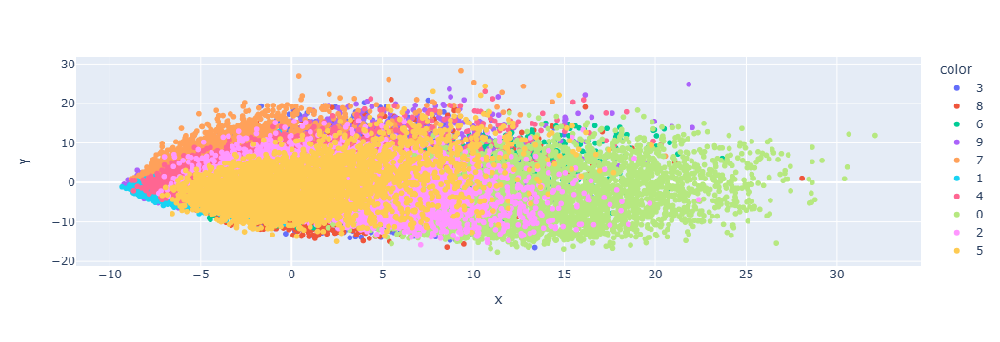

In [53]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig= px.scatter(x=X_train_trf[:,0],
               y=X_train_trf[:,1],
               color = y_train_trf,
                
               )
fig.show()

In [59]:
pca = PCA(n_components= 3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

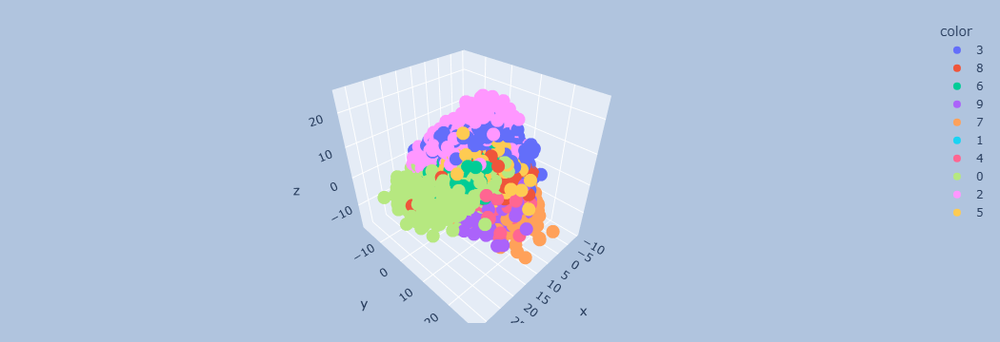

In [60]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig= px.scatter_3d(x=X_train_trf[:,0],
               y=X_train_trf[:,1],
                z= X_train_trf[:,2],
               color = y_train_trf,
                
               )
fig.update_layout(margin=dict(l=20,r=20,t=20,b=20),
                  paper_bgcolor='LightSteelBlue'
                 )
fig.show()

In [63]:
pca.explained_variance_

array([40.53496024, 29.25573146, 26.93674005])

In [65]:
pca = PCA(n_components= None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [69]:
pca.components_.shape

(784, 784)

In [67]:
pca.explained_variance_


array([4.05349602e+01, 2.92557315e+01, 2.69367401e+01, 2.06574702e+01,
       1.80349639e+01, 1.57052893e+01, 1.37434045e+01, 1.25417237e+01,
       1.09961345e+01, 1.00149120e+01, 9.57791235e+00, 8.66112143e+00,
       8.00872208e+00, 7.82081857e+00, 7.33547886e+00, 7.12535928e+00,
       6.70833389e+00, 6.60711329e+00, 6.38701351e+00, 6.20269914e+00,
       5.92391652e+00, 5.76712141e+00, 5.53689243e+00, 5.32454520e+00,
       5.13930320e+00, 5.01788759e+00, 4.88577383e+00, 4.71145843e+00,
       4.56305723e+00, 4.40331486e+00, 4.27563036e+00, 4.23672724e+00,
       4.08521028e+00, 4.03708465e+00, 3.99882793e+00, 3.88934914e+00,
       3.82513070e+00, 3.74641534e+00, 3.69617491e+00, 3.44487775e+00,
       3.43687092e+00, 3.39951717e+00, 3.30249775e+00, 3.23476980e+00,
       3.19923200e+00, 3.17289360e+00, 3.13549742e+00, 3.08906959e+00,
       3.06488419e+00, 3.01230954e+00, 2.89998416e+00, 2.85919673e+00,
       2.80006816e+00, 2.77665158e+00, 2.77027077e+00, 2.69339122e+00,
      

In [71]:
pca.explained_variance_ratio_

array([5.69299379e-02, 4.10886545e-02, 3.78317119e-02, 2.90126963e-02,
       2.53294778e-02, 2.20575310e-02, 1.93021323e-02, 1.76144135e-02,
       1.54436874e-02, 1.40655946e-02, 1.34518438e-02, 1.21642430e-02,
       1.12479708e-02, 1.09840669e-02, 1.03024242e-02, 1.00073186e-02,
       9.42162098e-03, 9.27946017e-03, 8.97033770e-03, 8.71147460e-03,
       8.31993414e-03, 8.09972087e-03, 7.77637230e-03, 7.47813802e-03,
       7.21797209e-03, 7.04744811e-03, 6.86189894e-03, 6.61707903e-03,
       6.40865473e-03, 6.18430214e-03, 6.00497371e-03, 5.95033564e-03,
       5.73753535e-03, 5.66994459e-03, 5.61621436e-03, 5.46245522e-03,
       5.37226265e-03, 5.26170967e-03, 5.19114875e-03, 4.83821065e-03,
       4.82696533e-03, 4.77450329e-03, 4.63824290e-03, 4.54312136e-03,
       4.49320976e-03, 4.45621839e-03, 4.40369676e-03, 4.33849050e-03,
       4.30452294e-03, 4.23068368e-03, 4.07292660e-03, 4.01564208e-03,
       3.93259807e-03, 3.89971030e-03, 3.89074867e-03, 3.78277403e-03,
      